In [10]:
import pandas as pd
import numpy as np 
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor,AdaBoostRegressor,RandomForestRegressor
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score,precision_score,recall_score,confusion_matrix
from catboost import CatBoostRegressor
import matplotlib.pyplot as plt
from lightgbm import LGBMRegressor
import xgboost as xg
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform, randint
import seaborn as sns





In [2]:
data = pd.read_csv("C:\Desktop\project\digital-eye.csv")
data.head()

,Name,Age,Sex,wearables,Duration,onlineplatforms,Nature,screenillumination,workingyears,hoursspentdailycurricular,...,Severityofcomplaints,RVIS,Ocularsymptomsobservedlately,Symptomsobservingatleasthalfofthetimes,Complaintsfrequency,frequencyofdryeyes,Schimers1Lefteye,Schimers1righteye,Schimers2Lefteye,Schimers2righteye
0,Syeda Afiya,22.0,2.0,1.0,2.0,1.0,2.0,2.0,1.0,1.0,...,1,1.0,13569.0,1345.0,3.0,2.0,12.0,13.0,16.0,14.0
1,Hemanth,24.0,1.0,1.0,2.0,2.0,2.0,1.0,2.0,1.0,...,0,0.0,6.0,3.0,1.0,1.0,25.0,28.0,30.0,32.0
2,Kranthi,23.0,1.0,5.0,NaN,2.0,2.0,3.0,3.0,4.0,...,2,1.0,135679.0,12345.0,2.0,1.0,8.0,6.0,9.0,8.0
3,Sk.M.A.Khadeer,23.0,1.0,1.0,2.0,2.0,2.0,1.0,1.0,1.0,...,1,1.0,135.0,23.0,3.0,1.0,13.0,14.0,15.0,14.0
4,B.Shravan kumar,27.0,1.0,3.0,2.0,2.0,1.0,1.0,1.0,1.0,...,0,0.0,7.0,23.0,2.0,3.0,34.0,32.0,35.0,35.0


In [48]:
data['frequencyofdryeyes']

0      2.0
1      1.0
2      1.0
3      1.0
4      3.0
      ... 
295    2.0
296    2.0
297    2.0
298    2.0
299    2.0
Name: frequencyofdryeyes, Length: 300, dtype: float64

In [3]:
for index, row in data.iterrows():
    if row['Schimers1Lefteye'] < 5:
        print(row['Name'])


Joy
M.Rahul
Priya


In [4]:
data.columns

Index(['Name', 'Age', 'Sex', 'wearables', 'Duration', 'onlineplatforms',
       'Nature', 'screenillumination', 'workingyears',
       'hoursspentdailycurricular', 'hoursspentdailynoncurricular',
       'Gadgetsused', 'levelofgadjetwithrespecttoeyes',
       'Distancekeptbetweeneyesandgadjet', 'Avgnighttimeusageperday',
       'Blinkingduringscreenusage', 'Difficultyinfocusingafterusingscreens',
       'freqquencyofcomplaints', 'Severityofcomplaints', 'RVIS',
       'Ocularsymptomsobservedlately',
       'Symptomsobservingatleasthalfofthetimes', 'Complaintsfrequency',
       'frequencyofdryeyes', 'Schimers1Lefteye', 'Schimers1righteye',
       'Schimers2Lefteye', 'Schimers2righteye'],
      dtype='object')

In [5]:
data.dtypes

Name                                       object
Age                                       float64
Sex                                       float64
wearables                                 float64
Duration                                  float64
onlineplatforms                           float64
Nature                                    float64
screenillumination                        float64
workingyears                              float64
hoursspentdailycurricular                 float64
hoursspentdailynoncurricular              float64
Gadgetsused                               float64
levelofgadjetwithrespecttoeyes            float64
Distancekeptbetweeneyesandgadjet          float64
Avgnighttimeusageperday                   float64
Blinkingduringscreenusage                 float64
Difficultyinfocusingafterusingscreens     float64
freqquencyofcomplaints                      int64
Severityofcomplaints                        int64
RVIS                                      float64


In [6]:
data.isna().sum()

Name                                        0
Age                                         0
Sex                                         0
wearables                                   0
Duration                                  110
onlineplatforms                             5
Nature                                     19
screenillumination                          2
workingyears                                6
hoursspentdailycurricular                   5
hoursspentdailynoncurricular                2
Gadgetsused                                 0
levelofgadjetwithrespecttoeyes              0
Distancekeptbetweeneyesandgadjet            1
Avgnighttimeusageperday                     0
Blinkingduringscreenusage                   0
Difficultyinfocusingafterusingscreens       0
freqquencyofcomplaints                      0
Severityofcomplaints                        0
RVIS                                        0
Ocularsymptomsobservedlately                2
Symptomsobservingatleasthalfofthet

In [7]:
data['Duration'].fillna(value=data['Duration'].mean(),inplace=True)
data['onlineplatforms'].fillna(value=data['onlineplatforms'].mean(),inplace=True)
data['Nature'].fillna(value=data['Nature'].mean(),inplace=True)
data['screenillumination'].fillna(value=data['screenillumination'].mean(),inplace=True)
data['workingyears'].fillna(value=data['workingyears'].mean(),inplace=True)
data['hoursspentdailycurricular'].fillna(value=data['hoursspentdailycurricular'].mean(),inplace=True)
data['hoursspentdailynoncurricular'].fillna(value=data['hoursspentdailynoncurricular'].mean(),inplace=True)
data['Distancekeptbetweeneyesandgadjet'].fillna(value=data['Distancekeptbetweeneyesandgadjet'].mean(),inplace=True)
data['Ocularsymptomsobservedlately'].fillna(value=data['Ocularsymptomsobservedlately'].mean(),inplace=True)
data['Symptomsobservingatleasthalfofthetimes'].fillna(value=data['Symptomsobservingatleasthalfofthetimes'].mean(),inplace=True)



In [8]:
data.isna().sum()

Name                                      0
Age                                       0
Sex                                       0
wearables                                 0
Duration                                  0
onlineplatforms                           0
Nature                                    0
screenillumination                        0
workingyears                              0
hoursspentdailycurricular                 0
hoursspentdailynoncurricular              0
Gadgetsused                               0
levelofgadjetwithrespecttoeyes            0
Distancekeptbetweeneyesandgadjet          0
Avgnighttimeusageperday                   0
Blinkingduringscreenusage                 0
Difficultyinfocusingafterusingscreens     0
freqquencyofcomplaints                    0
Severityofcomplaints                      0
RVIS                                      0
Ocularsymptomsobservedlately              0
Symptomsobservingatleasthalfofthetimes    0
Complaintsfrequency             

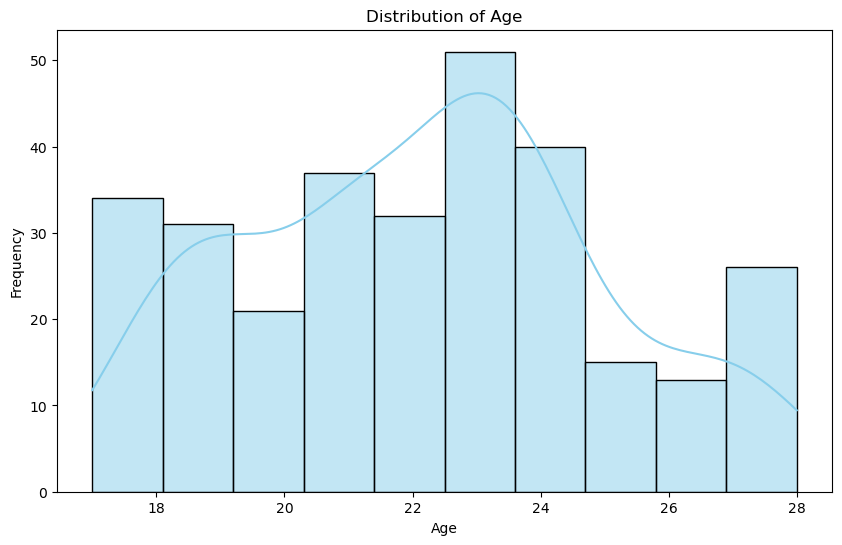

In [12]:
plt.figure(figsize=(10, 6))
sns.histplot(data['Age'], bins=10, kde=True, color='skyblue')
plt.title('Distribution of Age')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()



## More people belonged to the age 24

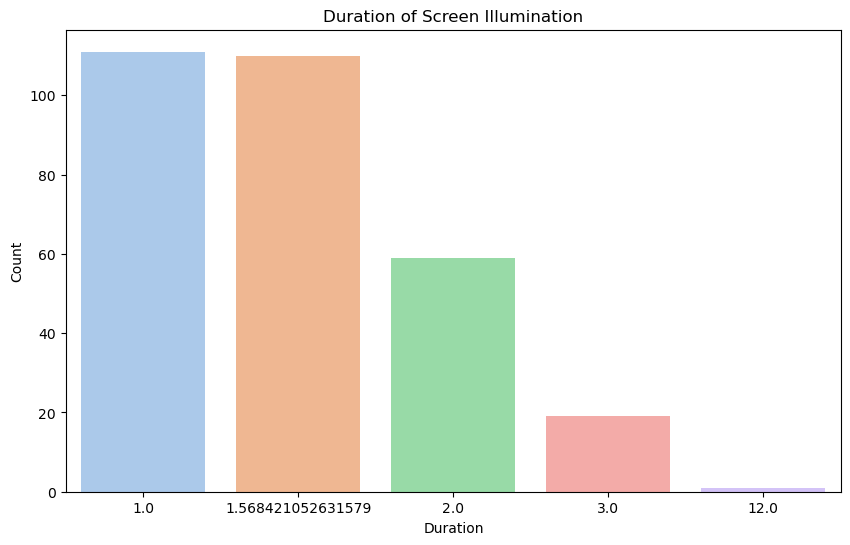

In [13]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Duration', data=data, palette='pastel')
plt.title('Duration of Screen Illumination')
plt.xlabel('Duration')
plt.ylabel('Count')
plt.show()




## 1 hour is the maximum duration of screem illumination

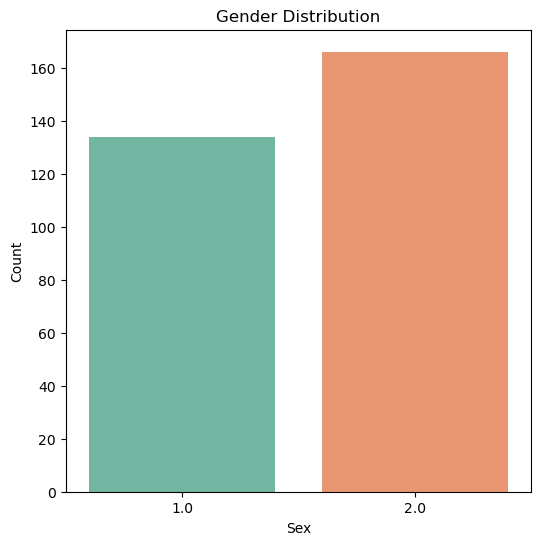

In [15]:
plt.figure(figsize=(6, 6))
sns.countplot(x='Sex', data=data, palette='Set2')
plt.title('Gender Distribution')
plt.xlabel('Sex')
plt.ylabel('Count')
plt.show()

## More females than males

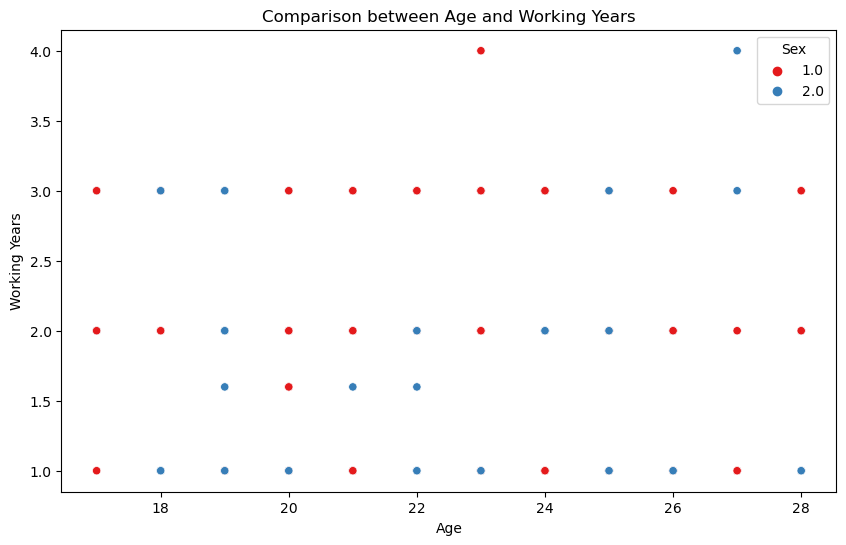

In [16]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Age', y='workingyears', data=data, hue='Sex', palette='Set1')
plt.title('Comparison between Age and Working Years')
plt.xlabel('Age')
plt.ylabel('Working Years')
plt.legend(title='Sex')
plt.show()




## Most males work more years than females according tothe given data

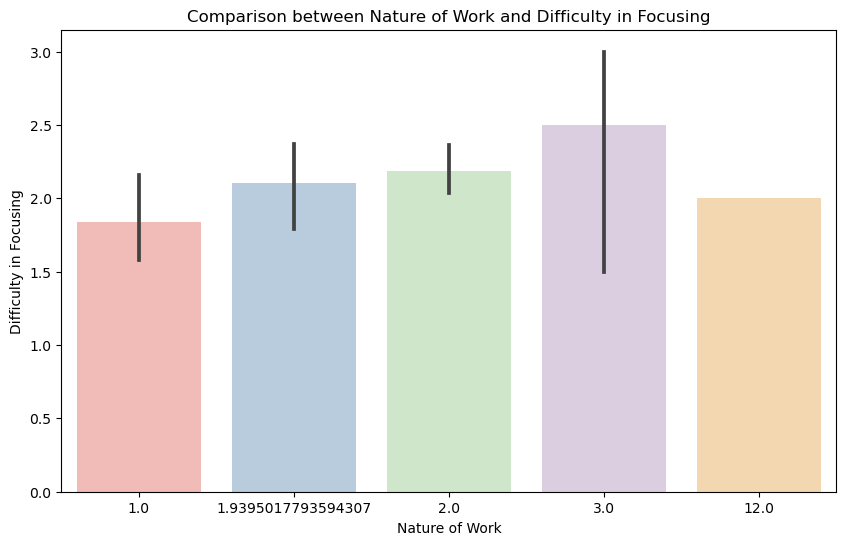

In [17]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Nature', y='Difficultyinfocusingafterusingscreens', data=data, palette='Pastel1')
plt.title('Comparison between Nature of Work and Difficulty in Focusing')
plt.xlabel('Nature of Work')
plt.ylabel('Difficulty in Focusing')
plt.show()



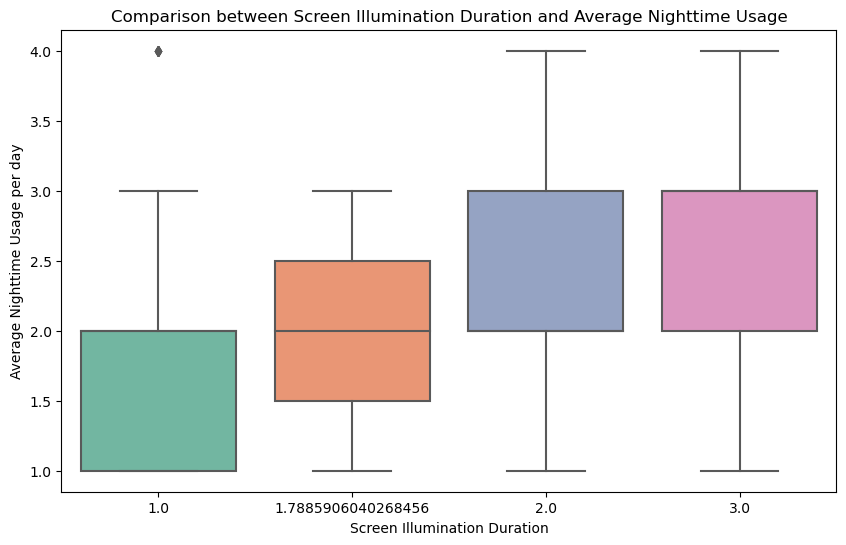

In [19]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='screenillumination', y='Avgnighttimeusageperday', data=data, palette='Set2')
plt.title('Comparison between Screen Illumination Duration and Average Nighttime Usage')
plt.xlabel('Screen Illumination Duration')
plt.ylabel('Average Nighttime Usage per day')
plt.show()

## The more night time usage is for the 2 and 3 hour people

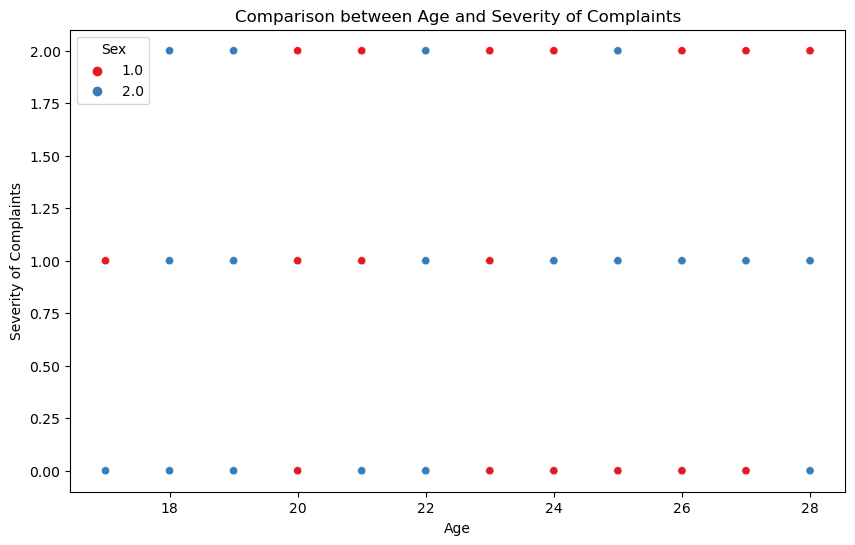

In [20]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Age', y='Severityofcomplaints', data=data, hue='Sex', palette='Set1')
plt.title('Comparison between Age and Severity of Complaints')
plt.xlabel('Age')
plt.ylabel('Severity of Complaints')
plt.legend(title='Sex')
plt.show()


## After the age of 24 severity of complains increase

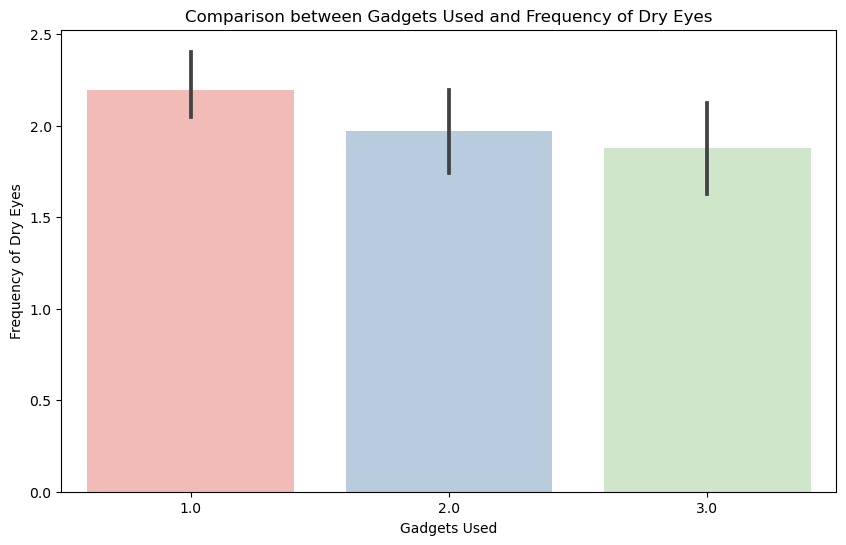

In [26]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Gadgetsused', y='frequencyofdryeyes', data=data, palette='Pastel1')
plt.title('Comparison between Gadgets Used and Frequency of Dry Eyes')
plt.xlabel('Gadgets Used')
plt.ylabel('Frequency of Dry Eyes')
plt.show()


## The frequency of dryness is more for people using only 1 gadget

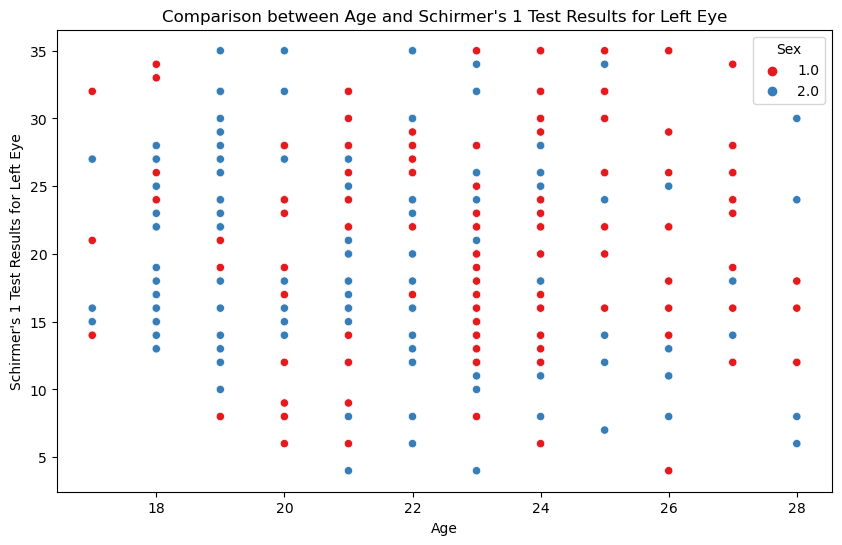

In [28]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Age', y='Schimers1Lefteye', data=data, hue='Sex', palette='Set1')
plt.title("Comparison between Age and Schirmer's 1 Test Results for Left Eye")
plt.xlabel('Age')
plt.ylabel("Schirmer's 1 Test Results for Left Eye")
plt.legend(title='Sex')
plt.show()


## More people between age group of 22 and 24 experience more dryness in the Left eye

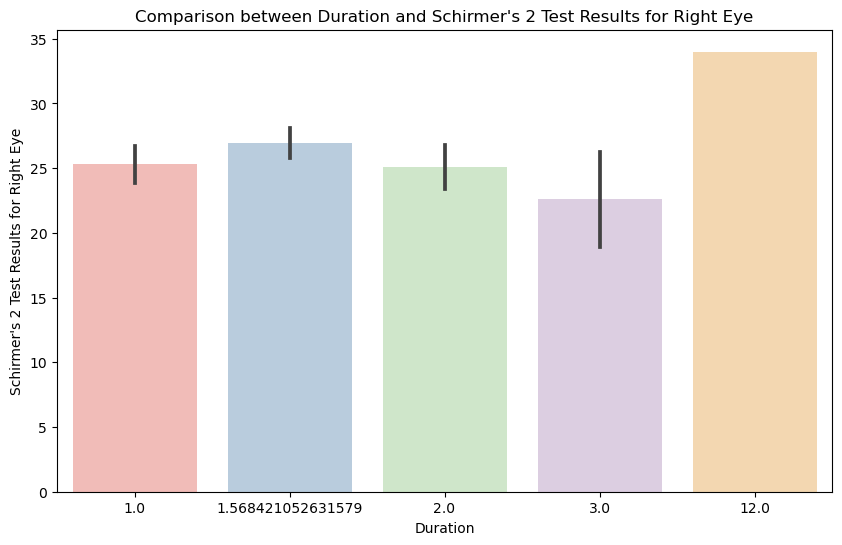

In [31]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Duration', y='Schimers2righteye', data=data, palette='Pastel1')
plt.title("Comparison between Duration and Schirmer's 2 Test Results for Right Eye")
plt.xlabel('Duration')
plt.ylabel("Schirmer's 2 Test Results for Right Eye")
plt.show()


## As the duration increases the dryness in the eyes also increases

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


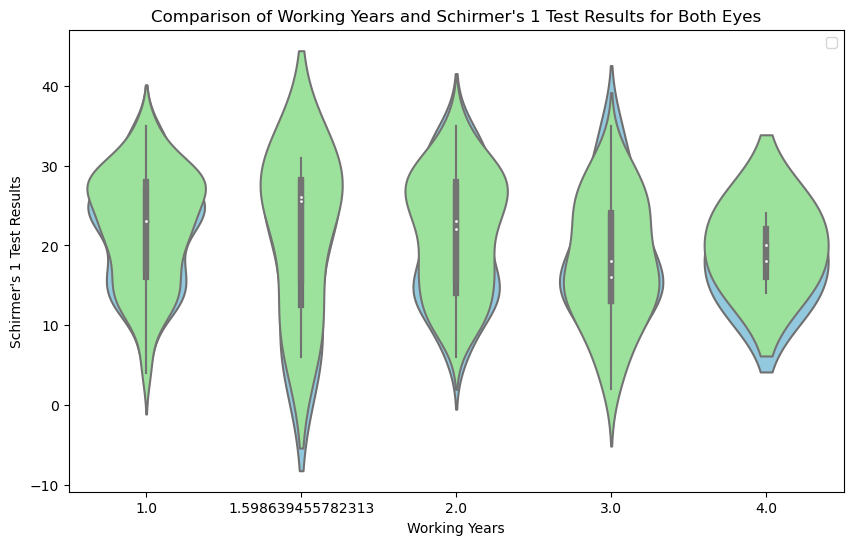

In [34]:
plt.figure(figsize=(10, 6))
sns.violinplot(x='workingyears', y='Schimers1Lefteye', data=data, color='skyblue', label='Left Eye')
sns.violinplot(x='workingyears', y='Schimers1righteye', data=data, color='lightgreen', label='Right Eye')
plt.title("Comparison of Working Years and Schirmer's 1 Test Results for Both Eyes")
plt.xlabel('Working Years')
plt.ylabel("Schirmer's 1 Test Results")
plt.legend()
plt.show()


## There is equal effect on both the eyes as the working years increase

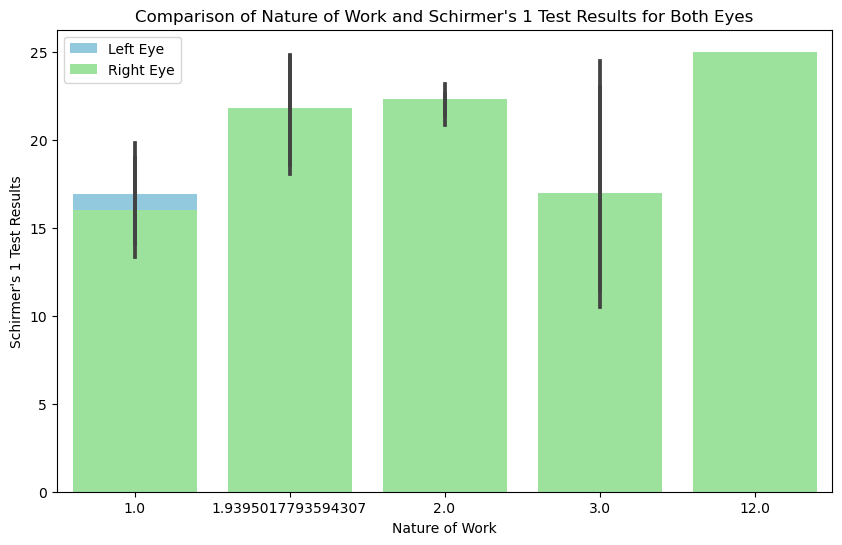

In [35]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Nature', y='Schimers1Lefteye', data=data, color='skyblue', label='Left Eye')
sns.barplot(x='Nature', y='Schimers1righteye', data=data, color='lightgreen', label='Right Eye')
plt.title("Comparison of Nature of Work and Schirmer's 1 Test Results for Both Eyes")
plt.xlabel('Nature of Work')
plt.ylabel("Schirmer's 1 Test Results")
plt.legend()
plt.show()


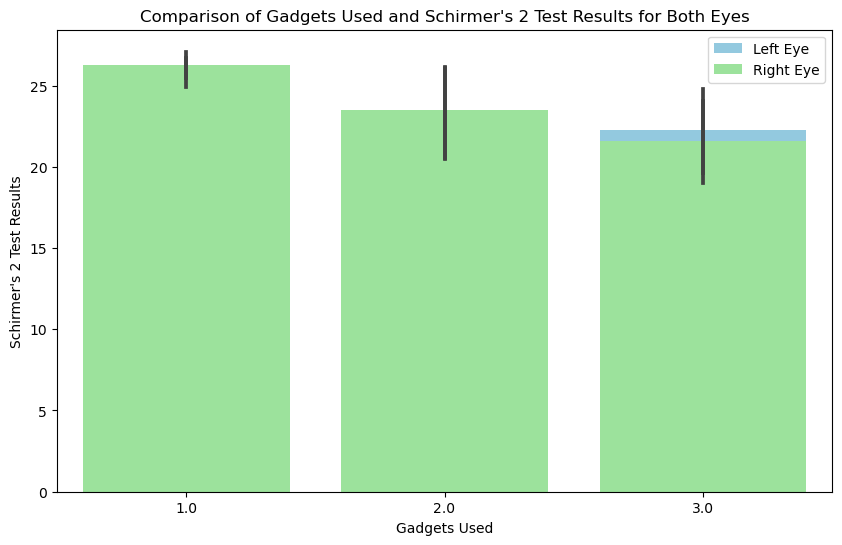

In [38]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Gadgetsused', y='Schimers2Lefteye', data=data, color='skyblue', label='Left Eye')
sns.barplot(x='Gadgetsused', y='Schimers2righteye', data=data, color='lightgreen', label='Right Eye')
plt.title("Comparison of Gadgets Used and Schirmer's 2 Test Results for Both Eyes")
plt.xlabel('Gadgets Used')
plt.ylabel("Schirmer's 2 Test Results")
plt.legend()
plt.show()


## PEople having only 1 gadget have more effect on both the eyes

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


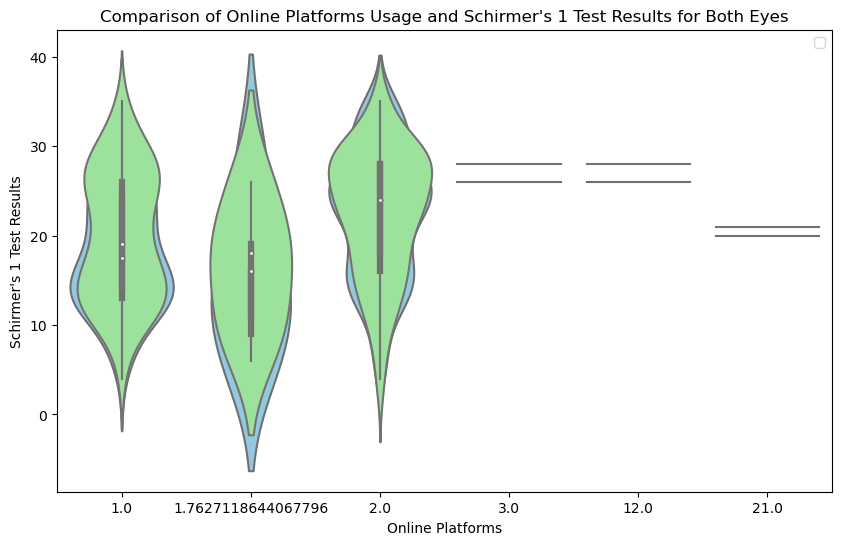

In [39]:
plt.figure(figsize=(10, 6))
sns.violinplot(x='onlineplatforms', y='Schimers1Lefteye', data=data, color='skyblue', label='Left Eye')
sns.violinplot(x='onlineplatforms', y='Schimers1righteye', data=data, color='lightgreen', label='Right Eye')
plt.title("Comparison of Online Platforms Usage and Schirmer's 1 Test Results for Both Eyes")
plt.xlabel('Online Platforms')
plt.ylabel("Schirmer's 1 Test Results")
plt.legend()
plt.show()


## People using more online platforms have bad Schirmers score

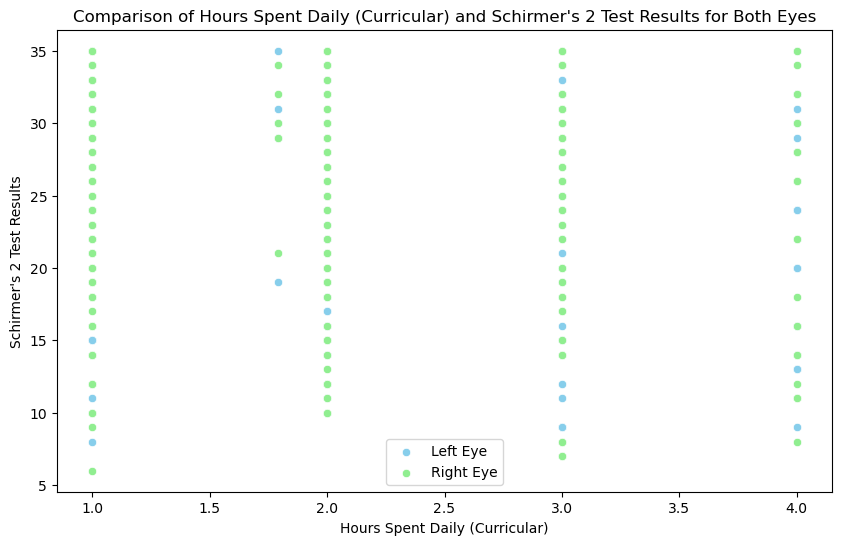

In [40]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='hoursspentdailycurricular', y='Schimers2Lefteye', data=data, color='skyblue', label='Left Eye')
sns.scatterplot(x='hoursspentdailycurricular', y='Schimers2righteye', data=data, color='lightgreen', label='Right Eye')
plt.title("Comparison of Hours Spent Daily (Curricular) and Schirmer's 2 Test Results for Both Eyes")
plt.xlabel('Hours Spent Daily (Curricular)')
plt.ylabel("Schirmer's 2 Test Results")
plt.legend()
plt.show()


## People spending more then 2 hours on circullars have better results

In [18]:
data['Nature']

0      2.0
1      2.0
2      2.0
3      2.0
4      1.0
      ... 
295    2.0
296    2.0
297    2.0
298    2.0
299    2.0
Name: Nature, Length: 300, dtype: float64

In [14]:
data.head()

,Name,Age,Sex,wearables,Duration,onlineplatforms,Nature,screenillumination,workingyears,hoursspentdailycurricular,...,Severityofcomplaints,RVIS,Ocularsymptomsobservedlately,Symptomsobservingatleasthalfofthetimes,Complaintsfrequency,frequencyofdryeyes,Schimers1Lefteye,Schimers1righteye,Schimers2Lefteye,Schimers2righteye
0,Syeda Afiya,22.0,2.0,1.0,2.000000,1.0,2.0,2.0,1.0,1.0,...,1,1.0,13569.0,1345.0,3.0,2.0,12.0,13.0,16.0,14.0
1,Hemanth,24.0,1.0,1.0,2.000000,2.0,2.0,1.0,2.0,1.0,...,0,0.0,6.0,3.0,1.0,1.0,25.0,28.0,30.0,32.0
2,Kranthi,23.0,1.0,5.0,1.568421,2.0,2.0,3.0,3.0,4.0,...,2,1.0,135679.0,12345.0,2.0,1.0,8.0,6.0,9.0,8.0
3,Sk.M.A.Khadeer,23.0,1.0,1.0,2.000000,2.0,2.0,1.0,1.0,1.0,...,1,1.0,135.0,23.0,3.0,1.0,13.0,14.0,15.0,14.0
4,B.Shravan kumar,27.0,1.0,3.0,2.000000,2.0,1.0,1.0,1.0,1.0,...,0,0.0,7.0,23.0,2.0,3.0,34.0,32.0,35.0,35.0


In [9]:
X = data.drop(['Name','Schimers1Lefteye','Schimers1righteye','Schimers2Lefteye','Schimers2righteye'],axis=1)
Y = data[['Schimers1Lefteye','Schimers1righteye','Schimers2Lefteye','Schimers2righteye']]

In [10]:
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.2,random_state=42)

# 6 models to  be used
1.Gradient boosting
2.Cat Boost
3.Ada boost
4.Light Gbm
5.XGBOOST
6.RAndomForestRegressor

## Gradient Boost Regressor

In [11]:
model = MultiOutputRegressor(GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42))


In [12]:
model.fit(X_train,Y_train)

MultiOutputRegressor(estimator=GradientBoostingRegressor(random_state=42))

In [13]:
predictions = model.predict(X_test)

In [14]:
from sklearn.metrics import mean_squared_error

mse = mean_squared_error(Y_test, predictions)
print("Mean Squared Error:", mse)


Mean Squared Error: 36.07459392598319


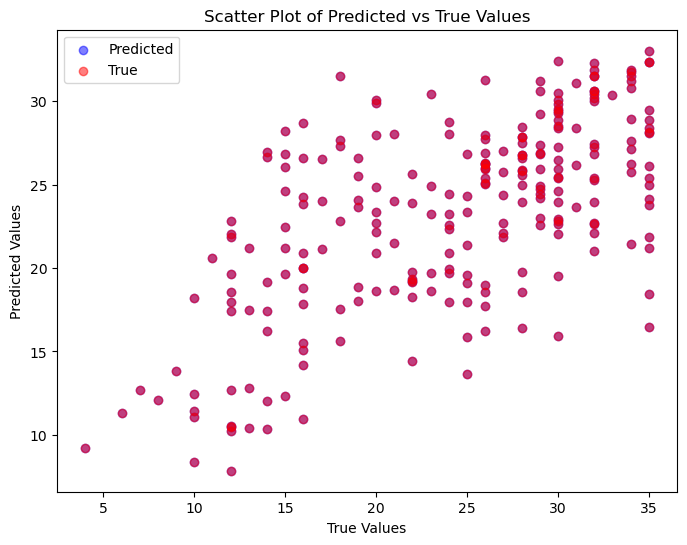

In [15]:
plt.figure(figsize=(8, 6))
plt.scatter(Y_test, predictions, color='blue', alpha=0.5, label='Predicted')
plt.scatter(Y_test, predictions, color='red', alpha=0.5, label='True')
plt.title('Scatter Plot of Predicted vs True Values')
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()


## CAT Boost Regressor

In [16]:
model1 = MultiOutputRegressor(CatBoostRegressor(loss_function='RMSE',random_state=42))
model1.fit(X_train, Y_train, verbose=100)

Learning rate set to 0.032678
0:	learn: 7.3191099	total: 108ms	remaining: 1m 47s
100:	learn: 4.4215768	total: 226ms	remaining: 2.01s
200:	learn: 3.4345177	total: 323ms	remaining: 1.28s
300:	learn: 2.7150221	total: 424ms	remaining: 986ms
400:	learn: 2.1376729	total: 528ms	remaining: 788ms
500:	learn: 1.6892190	total: 630ms	remaining: 628ms
600:	learn: 1.3745209	total: 742ms	remaining: 492ms
700:	learn: 1.1374372	total: 847ms	remaining: 361ms
800:	learn: 0.9461607	total: 953ms	remaining: 237ms
900:	learn: 0.7989608	total: 1.05s	remaining: 116ms
999:	learn: 0.6736804	total: 1.15s	remaining: 0us
Learning rate set to 0.032678
0:	learn: 7.3310831	total: 2.17ms	remaining: 2.17s
100:	learn: 4.2641607	total: 97.2ms	remaining: 865ms
200:	learn: 3.2607330	total: 188ms	remaining: 748ms
300:	learn: 2.4856003	total: 279ms	remaining: 648ms
400:	learn: 2.0355108	total: 368ms	remaining: 549ms
500:	learn: 1.6677444	total: 460ms	remaining: 458ms
600:	learn: 1.3675846	total: 553ms	remaining: 367ms
700:	le

MultiOutputRegressor(estimator=<catboost.core.CatBoostRegressor object at 0x000001A6D3756790>)

In [17]:
predictions = model1.predict(X_test)


In [18]:
mse = mean_squared_error(Y_test,predictions)
mse

36.05856819658634

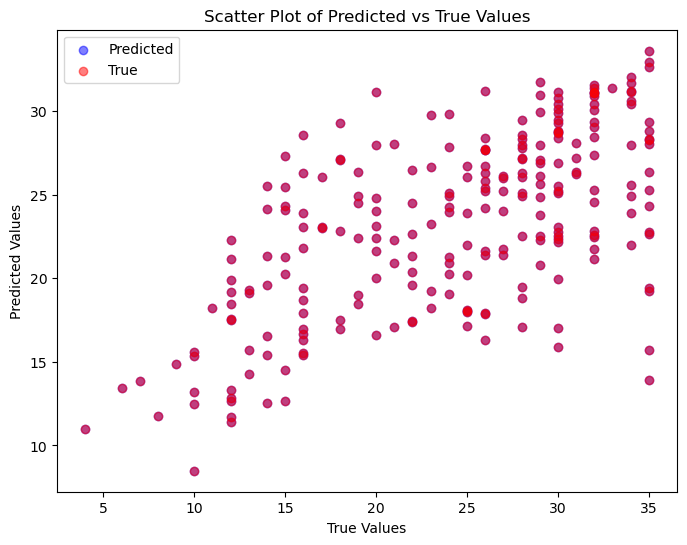

In [19]:
plt.figure(figsize=(8, 6))
plt.scatter(Y_test, predictions, color='blue', alpha=0.5, label='Predicted')
plt.scatter(Y_test, predictions, color='red', alpha=0.5, label='True')
plt.title('Scatter Plot of Predicted vs True Values')
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()

## Ada Boost Regressor

In [25]:
model2 = MultiOutputRegressor(AdaBoostRegressor(n_estimators=100,random_state=42))
model2.fit(X_train,Y_train)

MultiOutputRegressor(estimator=AdaBoostRegressor(n_estimators=100,
                                                 random_state=42))

In [26]:
predictions = model2.predict(X_test)
mse = mean_squared_error(Y_test,predictions)
mse

38.26249120379338

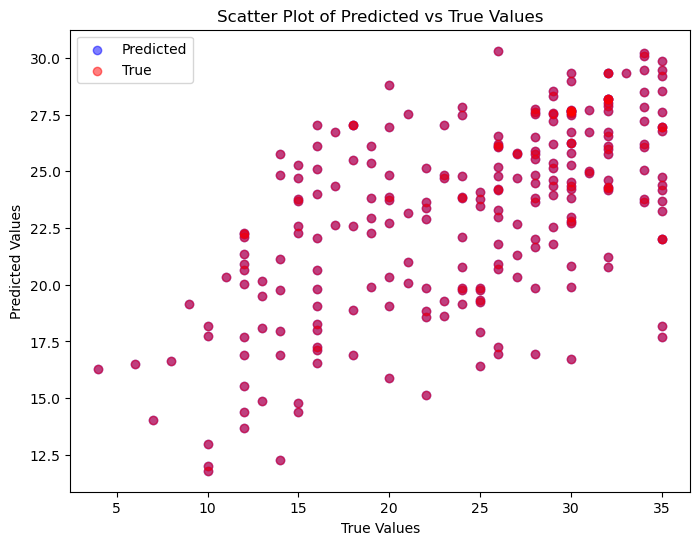

In [27]:
plt.figure(figsize=(8, 6))
plt.scatter(Y_test, predictions, color='blue', alpha=0.5, label='Predicted')
plt.scatter(Y_test, predictions, color='red', alpha=0.5, label='True')
plt.title('Scatter Plot of Predicted vs True Values')
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()

## LIGHTGBM

In [28]:
model3 = MultiOutputRegressor(LGBMRegressor(metrics='rmse',random_state=42))
model3.fit(X_train,Y_train)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 171
[LightGBM] [Info] Number of data points in the train set: 240, number of used features: 23
[LightGBM] [Info] Start training from score 20.775000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

MultiOutputRegressor(estimator=LGBMRegressor(metrics='rmse', random_state=42))

In [29]:
predictions = model3.predict(X_test)
mse = mean_squared_error(Y_test,predictions)
mse

40.1227620475166

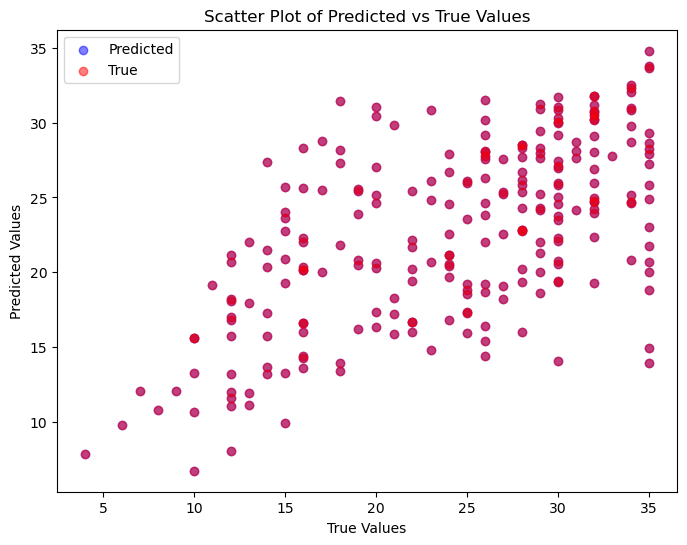

In [30]:
plt.figure(figsize=(8, 6))
plt.scatter(Y_test, predictions, color='blue', alpha=0.5, label='Predicted')
plt.scatter(Y_test, predictions, color='red', alpha=0.5, label='True')
plt.title('Scatter Plot of Predicted vs True Values')
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()

## Xgboost

In [31]:
model4  = MultiOutputRegressor(xg.XGBRegressor(n_estimators = 100,random_state=42))
model4.fit(X_train,Y_train)

MultiOutputRegressor(estimator=XGBRegressor(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            grow_policy=None,
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learning_rate=None, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=None,
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=100, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=42, ...))

In [32]:
predictions = model4.predict(X_test)
mse = mean_squared_error(Y_test,predictions)
mse

40.38699531836257

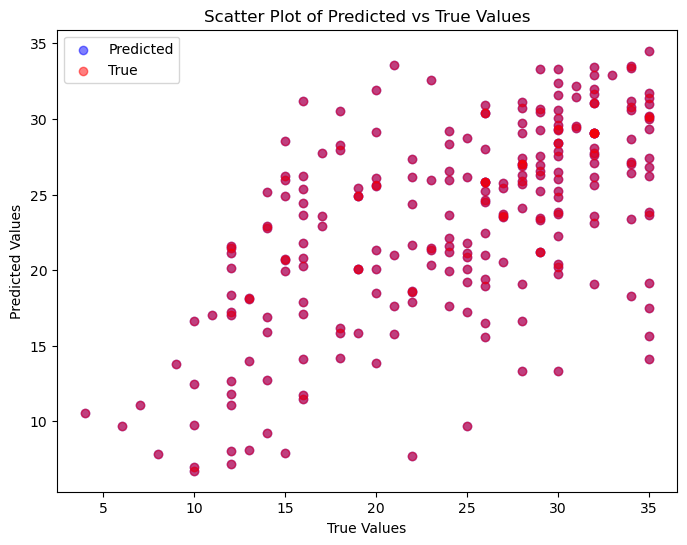

In [33]:
plt.figure(figsize=(8, 6))
plt.scatter(Y_test, predictions, color='blue', alpha=0.5, label='Predicted')
plt.scatter(Y_test, predictions, color='red', alpha=0.5, label='True')
plt.title('Scatter Plot of Predicted vs True Values')
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()

## RandomForestRegressor

In [34]:
model5 = MultiOutputRegressor(RandomForestRegressor(n_estimators=200,max_depth=4,random_state=42))
model5.fit(X_train,Y_train)

MultiOutputRegressor(estimator=RandomForestRegressor(max_depth=4,
                                                     n_estimators=200,
                                                     random_state=42))

In [35]:
predictions  = model5.predict(X_test)
mse = mean_squared_error(Y_test,predictions)
mse

36.67437379490681

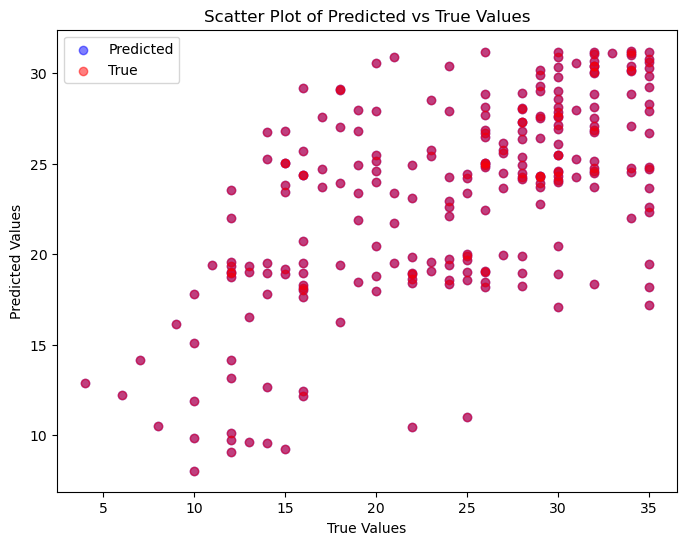

In [36]:
plt.figure(figsize=(8, 6))
plt.scatter(Y_test, predictions, color='blue', alpha=0.5, label='Predicted')
plt.scatter(Y_test, predictions, color='red', alpha=0.5, label='True')
plt.title('Scatter Plot of Predicted vs True Values')
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()

# Mean squared error
## 1.Gradient boosting:Mean Squared Error: 36.07459392598319
## 2.Cat Boost:36.05856819658634
## 3.Ada boost:38.26249120379338
## 4.Light Gbm:40.1227620475166
## 5.XGBOOST:40.38699531836257
## 6.RAndomForestRegressor:36.67437379490681

## We choose Catboost model as it has the least mean squared error value

## Hyperparameter tuning

In [37]:
distributions = {
    'estimator__iterations': randint(100, 1000), 
    'estimator__learning_rate': uniform(0.01, 0.3),    
    'estimator__depth': randint(3, 10),  
    'estimator__l2_leaf_reg': uniform(1, 10),  
}
clf  = RandomizedSearchCV(model1,distributions,n_iter=100,random_state=42,cv=5)
search = clf.fit(X_train,Y_train)
search.best_params_


0:	learn: 6.9788771	total: 2.13ms	remaining: 1.14s
1:	learn: 6.7170129	total: 5.68ms	remaining: 1.51s
2:	learn: 6.4354106	total: 6.26ms	remaining: 1.11s
3:	learn: 6.2697134	total: 8.98ms	remaining: 1.19s
4:	learn: 6.0444081	total: 10.3ms	remaining: 1.09s
5:	learn: 5.8453763	total: 11.1ms	remaining: 982ms
6:	learn: 5.7051822	total: 13.2ms	remaining: 993ms
7:	learn: 5.5685518	total: 15.6ms	remaining: 1.02s
8:	learn: 5.4375452	total: 19.5ms	remaining: 1.14s
9:	learn: 5.3197775	total: 21.7ms	remaining: 1.14s
10:	learn: 5.2052982	total: 23.6ms	remaining: 1.12s
11:	learn: 5.0760378	total: 25.6ms	remaining: 1.11s
12:	learn: 4.9367729	total: 26.2ms	remaining: 1.05s
13:	learn: 4.8255510	total: 28.2ms	remaining: 1.05s
14:	learn: 4.7514961	total: 28.8ms	remaining: 998ms
15:	learn: 4.6836605	total: 31.1ms	remaining: 1.01s
16:	learn: 4.6176085	total: 31.9ms	remaining: 971ms
17:	learn: 4.5237492	total: 34.7ms	remaining: 997ms
18:	learn: 4.4277465	total: 36.2ms	remaining: 982ms
19:	learn: 4.3560336	t

In [20]:
model2 = MultiOutputRegressor(CatBoostRegressor(depth=3,iterations=256,l2_leaf_reg=9.021969807540398,learning_rate=0.032365193103931246))
model2.fit(X_train,Y_train)

0:	learn: 7.3421203	total: 908us	remaining: 232ms
1:	learn: 7.3007621	total: 2.31ms	remaining: 294ms
2:	learn: 7.2479067	total: 3.11ms	remaining: 262ms
3:	learn: 7.1943534	total: 3.74ms	remaining: 236ms
4:	learn: 7.1391541	total: 4.89ms	remaining: 246ms
5:	learn: 7.0787585	total: 5.56ms	remaining: 232ms
6:	learn: 7.0352451	total: 6.6ms	remaining: 235ms
7:	learn: 6.9838981	total: 7.27ms	remaining: 225ms
8:	learn: 6.9198954	total: 7.91ms	remaining: 217ms
9:	learn: 6.8777160	total: 8.51ms	remaining: 209ms
10:	learn: 6.8442940	total: 9.18ms	remaining: 205ms
11:	learn: 6.7987569	total: 9.77ms	remaining: 199ms
12:	learn: 6.7534432	total: 10.6ms	remaining: 198ms
13:	learn: 6.7004151	total: 11.4ms	remaining: 198ms
14:	learn: 6.6492671	total: 12.4ms	remaining: 199ms
15:	learn: 6.6149544	total: 13.9ms	remaining: 208ms
16:	learn: 6.5893177	total: 14.7ms	remaining: 206ms
17:	learn: 6.5489902	total: 15.2ms	remaining: 201ms
18:	learn: 6.5138623	total: 15.6ms	remaining: 195ms
19:	learn: 6.4786948	tot

MultiOutputRegressor(estimator=<catboost.core.CatBoostRegressor object at 0x000001A6D382BC50>)

In [22]:
predictions = model2.predict(X_test)
mse = mean_squared_error(Y_test,predictions)
mse

33.932933455517436

In [23]:
import pickle
pickle.dump(model2,open('model.pkl','wb'))

In [24]:
data.columns

Index(['Name', 'Age', 'Sex', 'wearables', 'Duration', 'onlineplatforms',
       'Nature', 'screenillumination', 'workingyears',
       'hoursspentdailycurricular', 'hoursspentdailynoncurricular',
       'Gadgetsused', 'levelofgadjetwithrespecttoeyes',
       'Distancekeptbetweeneyesandgadjet', 'Avgnighttimeusageperday',
       'Blinkingduringscreenusage', 'Difficultyinfocusingafterusingscreens',
       'freqquencyofcomplaints', 'Severityofcomplaints', 'RVIS',
       'Ocularsymptomsobservedlately',
       'Symptomsobservingatleasthalfofthetimes', 'Complaintsfrequency',
       'frequencyofdryeyes', 'Schimers1Lefteye', 'Schimers1righteye',
       'Schimers2Lefteye', 'Schimers2righteye'],
      dtype='object')

In [26]:
new_instance = np.array(['19', '2', '3', '5', '2', '2', '2', '1', '1', '1', '2', '3', '1', '1', '3', '0', '0', '0', '10', '5', '1', '3', '2'])

# Convert data to float and reshape to 2D array
new_instance_2d = new_instance.astype(float).reshape(1, -1)

# Make prediction
prediction = model2.predict(new_instance_2d)

In [27]:
prediction

array([[24.50546587, 23.55621137, 26.64770802, 27.39945644]])

In [30]:
prediction[0][0]

24.50546586504621